In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


## IMPORT REQUIRED LIBARIES

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import random
import torchvision.transforms as T
import torchvision.models as models
import torch.nn as nn
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from tqdm import tqdm
import torchvision.ops as ops
from torchvision.ops import nms
from sklearn.metrics import precision_recall_curve, average_precision_score

## SECTION 3.1

In [51]:
class FruitSegmentationPreprocessor:
    def __init__(self, images_path: str, masks_path: str,iou_threshold:int):
        """
        Initialize the preprocessor with paths to images and masks
        """
        self.images_path = images_path
        self.masks_path = masks_path
        self.iou_threshold = iou_threshold

        # Load image and mask paths
        self.image_files = sorted(glob.glob(os.path.join(images_path, '*.png')))
        self.mask_files = sorted(glob.glob(os.path.join(masks_path, '*.png')))

        # Validate dataset
        assert len(self.image_files) == len(self.mask_files), "Number of images and masks must be the same"

    def masks_to_boxes(self, mask: np.ndarray) -> torch.Tensor:
        """
        Convert segmentation masks to bounding box annotations, handling overlaps and edge cases
        """
        binary_mask = (mask > 0).astype(np.uint8)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

        bounding_boxes = []
        scores = []
        for i in range(1, num_labels):
            x, y, w, h, area = stats[i]
            if area > 10:  # Filter out very small components (noise)
                bounding_boxes.append([x, y, x + w, y + h])
                scores.append(area)  # Use area as a confidence score

        if not bounding_boxes:
            return torch.empty((0, 4), dtype=torch.float32)

        bounding_boxes = torch.tensor(bounding_boxes, dtype=torch.float32)
        scores = torch.tensor(scores, dtype=torch.float32)

        # Apply Non-Maximum Suppression (NMS) to handle overlapping boxes
        keep = nms(bounding_boxes, scores, iou_threshold=self.iou_threshold)
        return bounding_boxes[keep]

    def visualize_original_with_boxes(self, num_examples: int = 5):
        """Display original images with overlaid bounding boxes"""
        num_examples = min(num_examples, len(self.image_files))
        for i in range(num_examples):
            image = cv2.imread(self.image_files[i])
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = cv2.imread(self.mask_files[i], cv2.IMREAD_GRAYSCALE)
            boxes = self.masks_to_boxes(mask)

            for (x1, y1, x2, y2) in boxes:
                cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

            plt.figure(figsize=(6, 6))
            plt.imshow(image)
            plt.title(f'Original Image with Bounding Boxes {i+1}')
            plt.axis('off')
            plt.show()

    def visualize_masks_with_boxes(self, num_examples: int = 5):
        """Display segmentation masks converted to bounding boxes"""
        num_examples = min(num_examples, len(self.mask_files))
        for i in range(num_examples):
            mask = cv2.imread(self.mask_files[i], cv2.IMREAD_GRAYSCALE)
            boxes = self.masks_to_boxes(mask)

            plt.figure(figsize=(6, 6))
            plt.imshow(mask, cmap='gray')
            for (x1, y1, x2, y2) in boxes:
                plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='red', fill=False, linewidth=2))
            plt.title(f'Segmentation Mask with Bounding Boxes {i+1}')
            plt.axis('off')
            plt.show()

    def visualize_side_by_side(self, num_examples: int = 5):
        """Display original masks and generated boxes side by side"""
        num_examples = min(num_examples, len(self.image_files))
        for i in range(num_examples):
            image = cv2.imread(self.image_files[i])
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = cv2.imread(self.mask_files[i], cv2.IMREAD_GRAYSCALE)

            # Generate bounding boxes
            boxes = self.masks_to_boxes(mask)
            image_with_boxes = image.copy()
            for (x1, y1, x2, y2) in boxes:
                cv2.rectangle(image_with_boxes, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

            fig, axs = plt.subplots(1, 2, figsize=(12, 6))
            plt.title(f"IOU Threshold {self.iou_threshold}")
            axs[0].imshow(mask, cmap='gray')
            axs[0].set_title(f'Segmentation Mask {i+1}')
            axs[0].axis('off')

            axs[1].imshow(image_with_boxes)
            axs[1].set_title(f'Original Image with Bounding Boxes {i+1}')
            axs[1].axis('off')

            plt.show()

In [52]:
images_path = '/content/drive/MyDrive/detection/train/images'
masks_path = '/content/drive/MyDrive/detection/train/masks'
iou_threshold= 0.5

# Preprocessing Visualization
print(f"Value of the threshold is {iou_threshold}")
preprocessor = FruitSegmentationPreprocessor(images_path, masks_path,iou_threshold)


Value of the threshold is 0.5


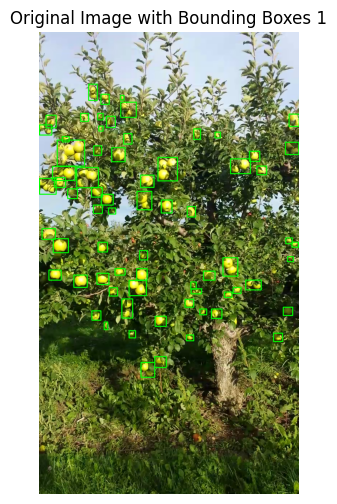

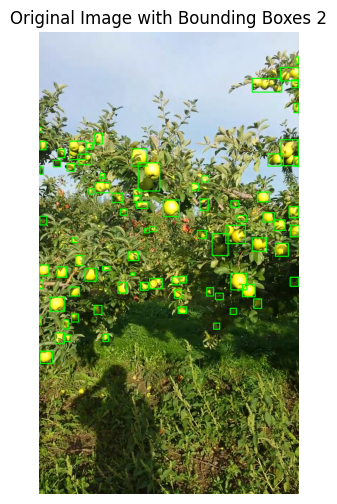

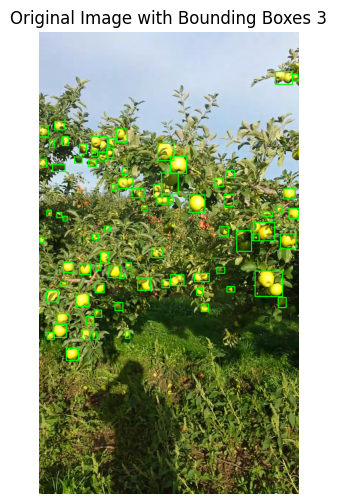

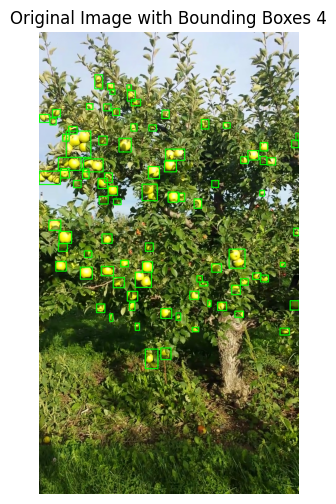

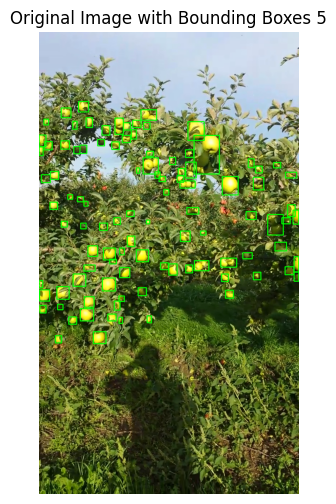

In [53]:
preprocessor.visualize_original_with_boxes()

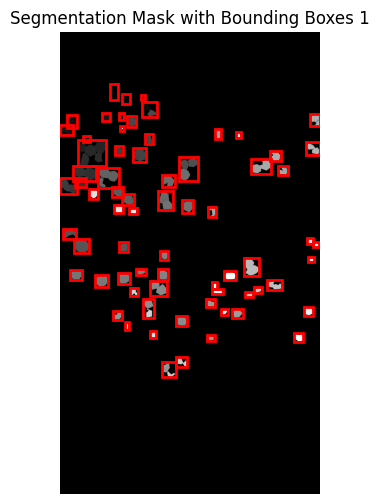

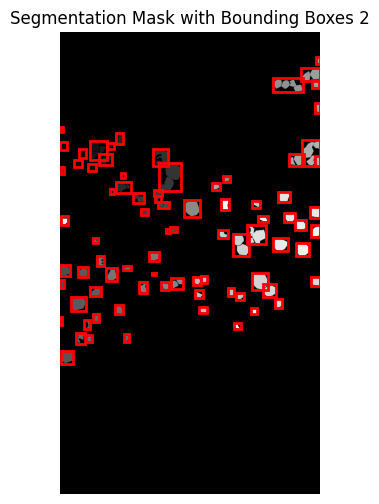

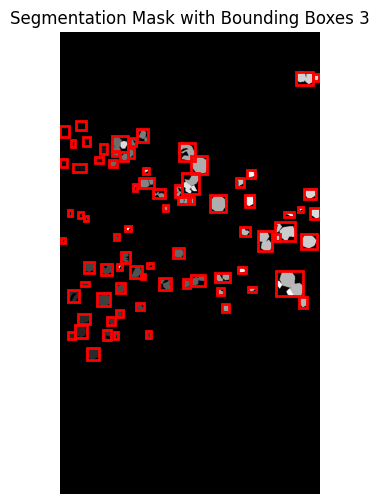

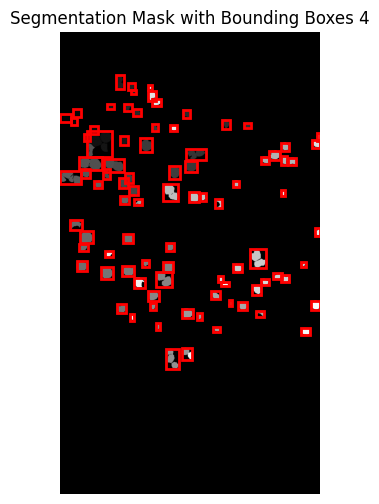

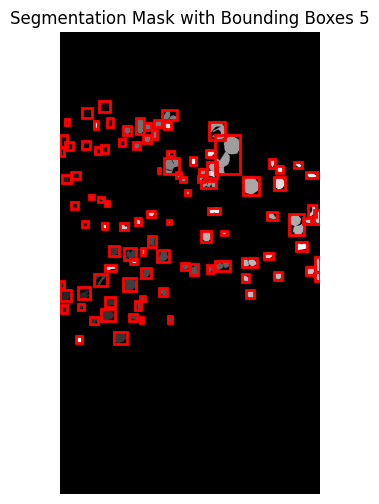

In [54]:
preprocessor.visualize_masks_with_boxes()

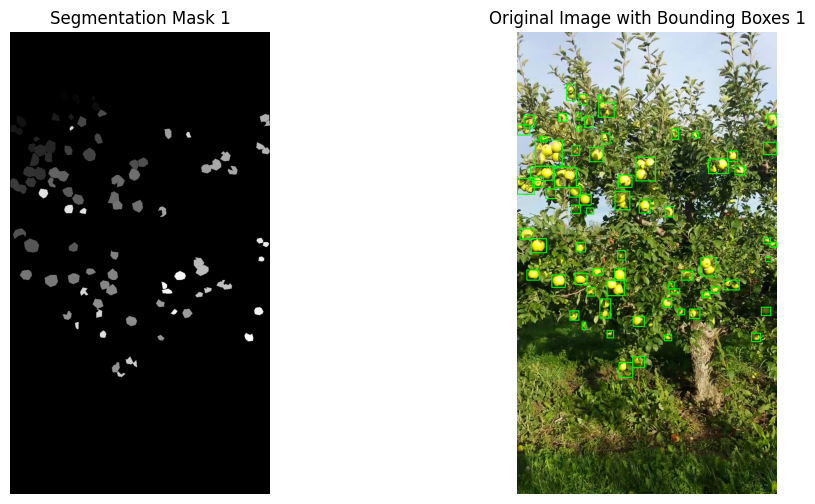

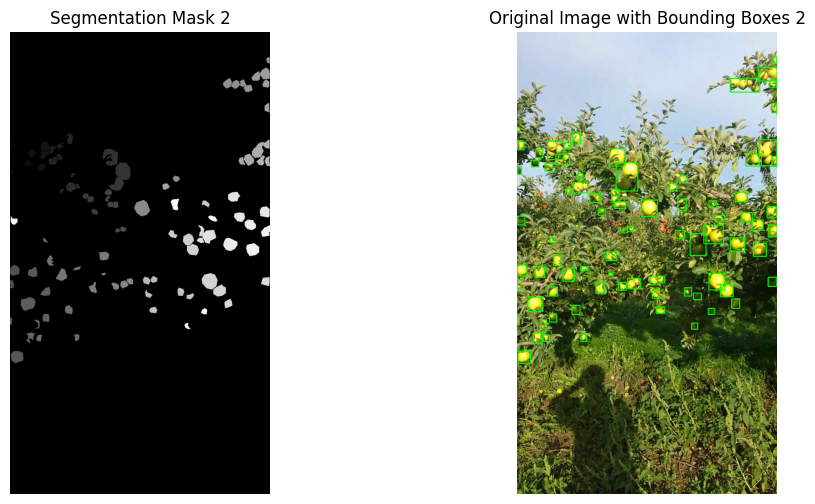

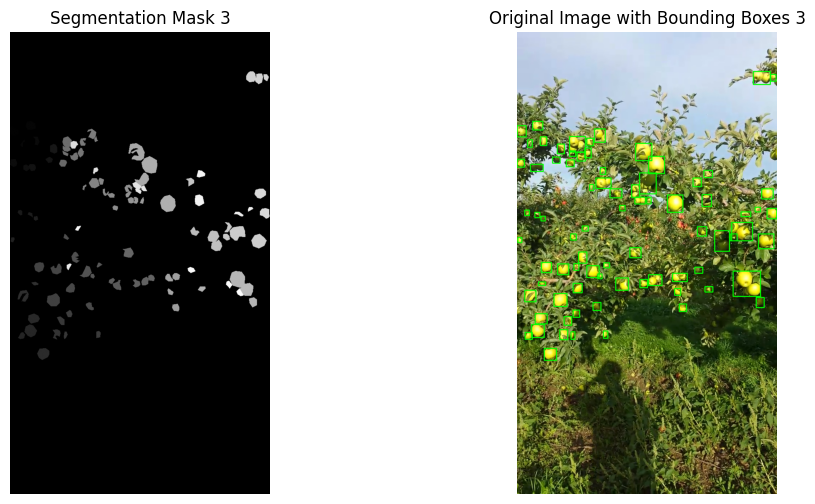

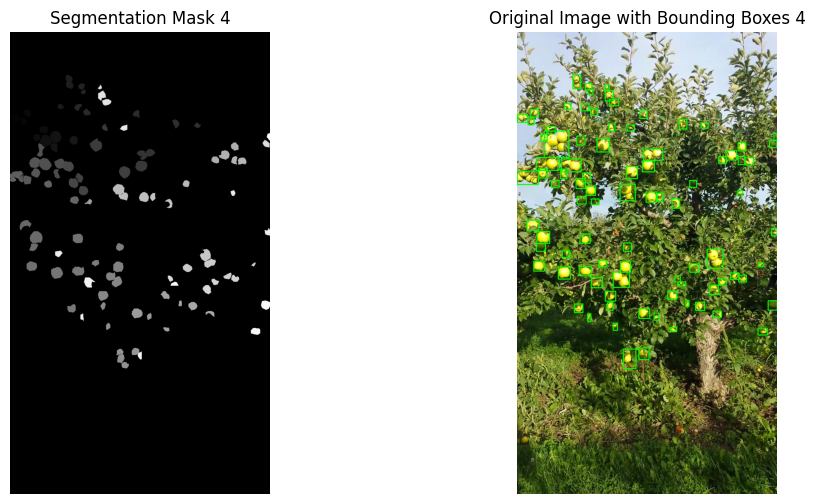

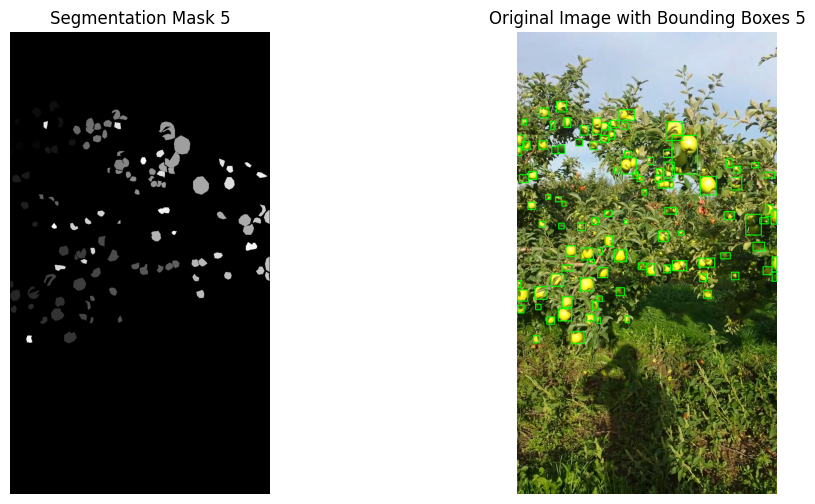

In [55]:
preprocessor.visualize_side_by_side()

Value of the threshold is 0.3


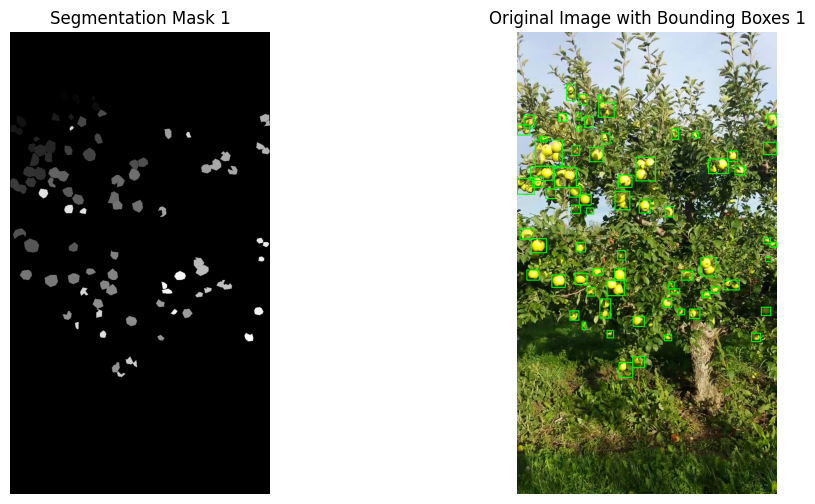

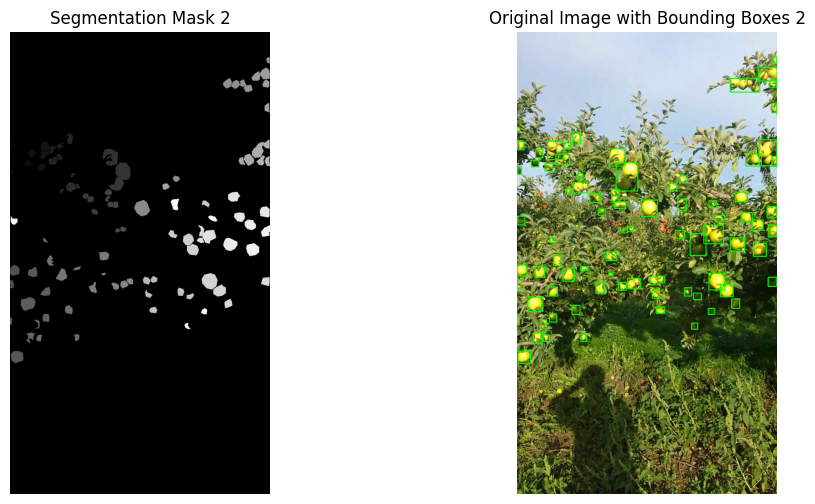

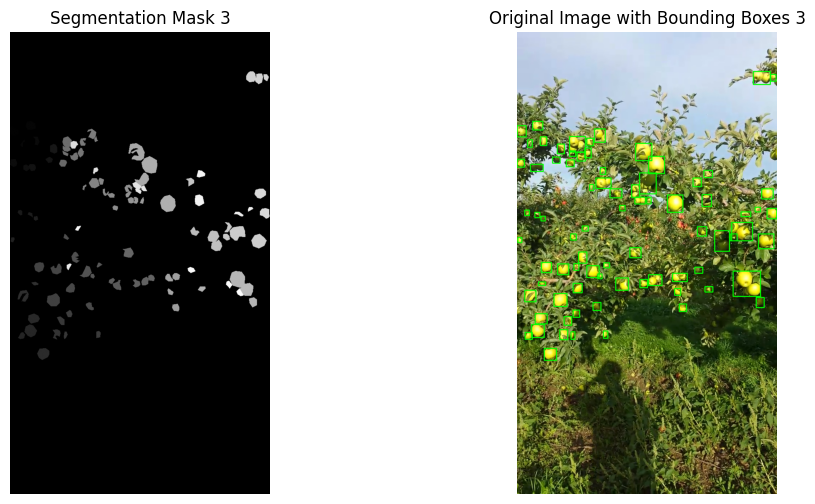

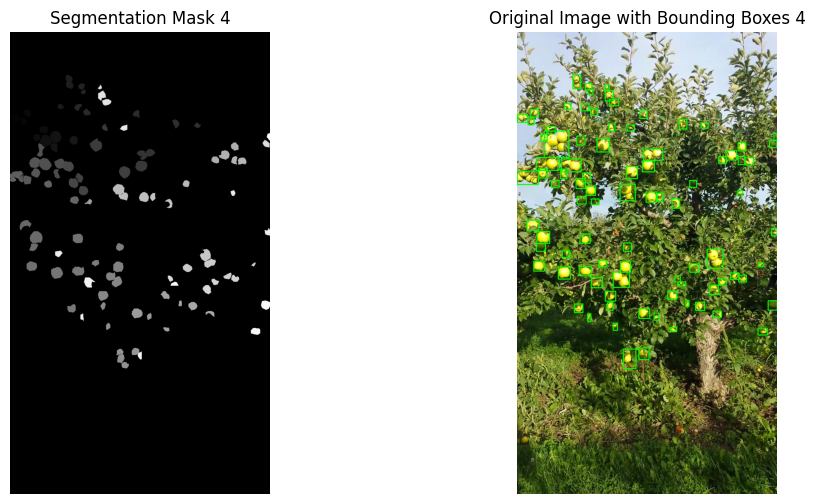

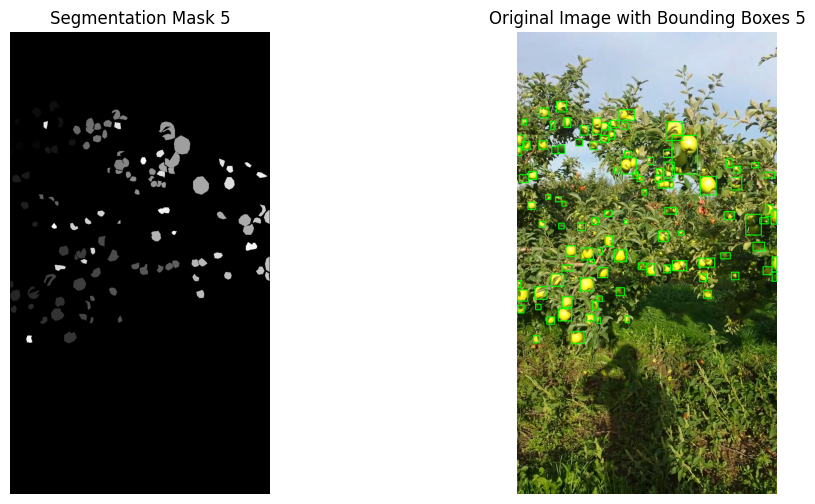

In [56]:
iou_threshold=0.3
print(f"Value of the threshold is {iou_threshold}")
preprocessor = FruitSegmentationPreprocessor(images_path, masks_path,iou_threshold)
preprocessor.visualize_side_by_side()

## SECTION 3.2


In [ ]:
import torchvision.transforms.functional as F
import torch
import random

# Rotate Image & Adjust Bounding Boxes
def rotate_image(image, boxes, angle=30):
    """
    Rotates the image and adjusts bounding boxes accordingly.
    :param image: PIL Image
    :param boxes: Tensor of shape (N, 4) with (x1, y1, x2, y2) format
    :param angle: Rotation angle (default=30 degrees)
    :return: Rotated image and transformed bounding boxes
    """
    w, h = image.size
    image = F.rotate(image, angle)

    # Convert (x1, y1, x2, y2) to (cx, cy, w, h) for easier rotation
    cx, cy = (boxes[:, 0] + boxes[:, 2]) / 2, (boxes[:, 1] + boxes[:, 3]) / 2
    box_w, box_h = boxes[:, 2] - boxes[:, 0], boxes[:, 3] - boxes[:, 1]

    # Apply rotation (Assuming center-based rotation around image center)
    angle_rad = torch.tensor(angle * (3.1415926535 / 180))  # Convert degrees to radians
    new_cx = (cx - w / 2) * torch.cos(angle_rad) - (cy - h / 2) * torch.sin(angle_rad) + w / 2
    new_cy = (cx - w / 2) * torch.sin(angle_rad) + (cy - h / 2) * torch.cos(angle_rad) + h / 2

    # Convert back to (x1, y1, x2, y2)
    new_boxes = torch.stack([
        new_cx - box_w / 2, new_cy - box_h / 2, 
        new_cx + box_w / 2, new_cy + box_h / 2
    ], dim=1)

    return image, new_boxes


# Horizontal Flip & Adjust Bounding Boxes
def horizontal_flip(image, boxes):
    """
    Flips image horizontally and adjusts bounding boxes.
    """
    w, _ = image.size
    image = F.hflip(image)
    new_boxes = boxes.clone()
    new_boxes[:, [0, 2]] = w - boxes[:, [2, 0]]  # Flip x-coordinates
    return image, new_boxes


# Vertical Flip & Adjust Bounding Boxes
def vertical_flip(image, boxes):
    """
    Flips image vertically and adjusts bounding boxes.
    """
    _, h = image.size
    image = F.vflip(image)
    new_boxes = boxes.clone()
    new_boxes[:, [1, 3]] = h - boxes[:, [3, 1]]  # Flip y-coordinates
    return image, new_boxes


# Adjust Brightness & Contrast
def adjust_brightness_contrast(image, brightness=0.2, contrast=0.2):
    """
    Adjusts brightness and contrast without affecting bounding boxes.
    """
    transform = T.ColorJitter(brightness=brightness, contrast=contrast)
    return transform(image)

In [57]:
class FruitDetectionDataset(Dataset):
    def __init__(self, images_path: str, masks_path: str, iou_threshold :int,transform=None):
        """Dataset class for loading images and bounding boxes for Faster R-CNN"""
        self.images_path = images_path
        self.masks_path = masks_path
        self.image_files = sorted(glob.glob(os.path.join(images_path, '*.png')))
        self.mask_files = sorted(glob.glob(os.path.join(masks_path, '*.png')))
        self.transform = transform
        self.iou_threshold = iou_threshold

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_files[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_files[idx], cv2.IMREAD_GRAYSCALE)

        # Convert mask to bounding boxes
        boxes = FruitSegmentationPreprocessor.masks_to_boxes(self, mask)

        # Convert to required format
        target = {
            'boxes': boxes,
            'labels': torch.ones((len(boxes),), dtype=torch.int64)  # Single class (fruit)
        }

        if self.transform:
            image = self.transform(image)

        return image, target

In [58]:
# Data augmentation (only for training set)

train_transform = T.Compose([
    T.ToPILImage(),
    T.ColorJitter(brightness=0.1, contrast=0.1),  # Mild brightness & contrast changes
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), # Normalize
    T.ToTensor()
])

# No transformations for validation & test sets
val_test_transform = T.Compose([
    T.ToPILImage(),
    T.ToTensor()
])

images_path = '/content/drive/MyDrive/detection/train/images'
masks_path = '/content/drive/MyDrive/detection/train/masks'

# Split dataset into train, validation, and test sets
iou_threshold = 0.3
full_dataset = FruitDetectionDataset(images_path, masks_path, iou_threshold)  # No transform here

train_size = int(0.8 * len(full_dataset))
val_size = int(0.10 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])

# Apply transformation only to training dataset
train_dataset.dataset.transform = train_transform  # Assign transform for training only
val_dataset.dataset.transform = val_test_transform  # No augmentation
test_dataset.dataset.transform = val_test_transform  # No augmentation

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda batch: tuple(zip(*batch)))
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda batch: tuple(zip(*batch)))
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda batch: tuple(zip(*batch)))

In [65]:
print(f"This is sample dataset value",train_dataset[0][1])

This is sample dataset value {'boxes': tensor([[ 559.,  782.,  596.,  826.],
        [   2., 1038.,   39., 1066.],
        [  55., 1060.,   91., 1101.],
        [ 151.,  839.,  181.,  862.],
        [ 396.,  188.,  418.,  205.],
        [ 480.,  992.,  496., 1010.]]), 'labels': tensor([1, 1, 1, 1, 1, 1])}


In [11]:
print(len(train_loader))
print(len(val_loader))
print(len(test_loader))

134
17
17


In [12]:
# Load pre-trained ResNet-34 model
resnet34 = models.resnet34(pretrained=True)

# Remove the fully connected layer
modules = list(resnet34.children())[:-2]
backbone = nn.Sequential(*modules)
backbone.out_channels = 512  # Output channels of ResNet-34's last convolutional layer

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:02<00:00, 40.8MB/s]


In [13]:
# Define anchor sizes and aspect ratios
anchor_generator = AnchorGenerator(
    sizes=((32, 64, 128, 256, 512),),
    aspect_ratios=((0.5, 1.0, 2.0),)
)

# Create the Faster R-CNN model
model = FasterRCNN(
    backbone,
    num_classes=2,  # 1 class (fruit) + background
    rpn_anchor_generator=anchor_generator,
    box_roi_pool=None
)
device='cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)
model.train()
# Define the optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
# Learning rate scheduler
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

### Justification of Anchor Box Configurations
-	We used sizes: (32, 64, 128, 256, 512) and aspect ratios: (0.5, 1.0, 2.0).

- This setup ensures multi-scale detection, capturing both small and large fruits.

- The aspect ratios help detect round, elongated, and irregularly shaped fruits effectively.


In [14]:
num_epochs = 15
best_val_map = 0.0
patience = 3
patience_counter = 0

for epoch in range(num_epochs):
    print(f"Running the Epoch {epoch}")
    model.train()
    train_loss = 0.0

    for images, targets in tqdm(train_loader):
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass (returns loss dictionary during training)
        loss_dict = model(images, targets)

        # Compute total loss
        losses = sum(loss for loss in loss_dict.values())
        train_loss += losses.item()

        # Backward pass and optimization
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()


    # Validation phase
    print("Doing Validation")
    model.eval()
    total_iou = 0.0
    total_samples = 0

    with torch.no_grad():
        for images, targets in tqdm(val_loader):
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Get predictions from the model (returns detections instead of loss)
            predictions = model(images)

            for pred, target in zip(predictions, targets):
                pred_boxes = pred['boxes']
                gt_boxes = target['boxes']
                # print("Length of pred",len(pred_boxes))
                # print("Length of gt",len(gt_boxes))

                if len(pred_boxes) > 0 and len(gt_boxes) > 0:
                    ious = ops.box_iou(pred_boxes, gt_boxes)
                    max_iou, _ = ious.max(dim=1)
                    total_iou += max_iou.mean().item()  # Average IoU per sample
                    total_samples += 1

    # Compute Mean IoU
    val_map = total_iou / total_samples if total_samples > 0 else 0.0

    print(f"Epoch {epoch+1}: Train Loss: {train_loss:.4f}, Val mAP (IoU): {val_map:.4f}")
    # Early stopping check (maximize mAP instead of minimizing loss)
    if val_map > best_val_map:
        best_val_map = val_map
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

Running the Epoch 0


100%|██████████| 134/134 [03:01<00:00,  1.35s/it]


Doing Validation


100%|██████████| 17/17 [00:18<00:00,  1.08s/it]


Epoch 1: Train Loss: 101.0823, Val mAP (IoU): 0.2848
Running the Epoch 1


100%|██████████| 134/134 [01:19<00:00,  1.69it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.15it/s]


Epoch 2: Train Loss: 106.2250, Val mAP (IoU): 0.3364
Running the Epoch 2


100%|██████████| 134/134 [01:19<00:00,  1.69it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch 3: Train Loss: 103.2080, Val mAP (IoU): 0.3485
Running the Epoch 3


100%|██████████| 134/134 [01:18<00:00,  1.70it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch 4: Train Loss: 98.0340, Val mAP (IoU): 0.3554
Running the Epoch 4


100%|██████████| 134/134 [01:18<00:00,  1.70it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.13it/s]


Epoch 5: Train Loss: 94.7866, Val mAP (IoU): 0.3770
Running the Epoch 5


100%|██████████| 134/134 [01:20<00:00,  1.66it/s]


Doing Validation


100%|██████████| 17/17 [00:12<00:00,  1.35it/s]


Epoch 6: Train Loss: 92.0213, Val mAP (IoU): 0.3730
Running the Epoch 6


100%|██████████| 134/134 [01:23<00:00,  1.60it/s]


Doing Validation


100%|██████████| 17/17 [00:09<00:00,  1.76it/s]


Epoch 7: Train Loss: 89.4707, Val mAP (IoU): 0.3864
Running the Epoch 7


100%|██████████| 134/134 [01:20<00:00,  1.66it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.16it/s]


Epoch 8: Train Loss: 86.5582, Val mAP (IoU): 0.3663
Running the Epoch 8


100%|██████████| 134/134 [01:18<00:00,  1.70it/s]


Doing Validation


100%|██████████| 17/17 [00:08<00:00,  2.10it/s]


Epoch 9: Train Loss: 84.3841, Val mAP (IoU): 0.4042
Running the Epoch 9


100%|██████████| 134/134 [01:19<00:00,  1.69it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch 10: Train Loss: 82.1266, Val mAP (IoU): 0.3676
Running the Epoch 10


100%|██████████| 134/134 [01:18<00:00,  1.70it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch 11: Train Loss: 80.5784, Val mAP (IoU): 0.3806
Running the Epoch 11


100%|██████████| 134/134 [01:20<00:00,  1.67it/s]


Doing Validation


100%|██████████| 17/17 [00:07<00:00,  2.30it/s]

Epoch 12: Train Loss: 77.8625, Val mAP (IoU): 0.3877
Early stopping triggered.


In [15]:
def visualize_predictions(model, val_dataset, num_examples=3):
        """Visualize model predictions vs. ground truth for random validation images"""
        model.eval()
        indices = random.sample(range(len(val_dataset)), num_examples)

        for idx in indices:
            image, target = val_dataset[idx]
            image = image.to(device)

            # Get model predictions
            with torch.no_grad():
                prediction = model([image])[0]

            # Apply NMS to filter overlapping predicted boxes
            pred_boxes = prediction['boxes']
            scores = prediction['scores']
            keep = nms(pred_boxes, scores, iou_threshold=0.2)
            pred_boxes = pred_boxes[keep].cpu().numpy()

            # Convert tensors to CPU for visualization
            image = image.cpu().permute(1, 2, 0).numpy()
            gt_boxes = target['boxes'].cpu().numpy()

            # Plot ground truth and predicted boxes
            fig, axs = plt.subplots(1, 2, figsize=(12, 6))

            # Ground Truth
            axs[0].imshow(image)
            for (x1, y1, x2, y2) in gt_boxes:
                axs[0].add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='red', fill=False, linewidth=1))
            axs[0].set_title("Ground Truth")
            axs[0].axis("off")

            # Predictions
            axs[1].imshow(image)
            for (x1, y1, x2, y2) in pred_boxes:
                axs[1].add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='blue', fill=False, linewidth=1))
            axs[1].set_title("Model Predictions (NMS Applied)")
            axs[1].axis("off")

            plt.show()


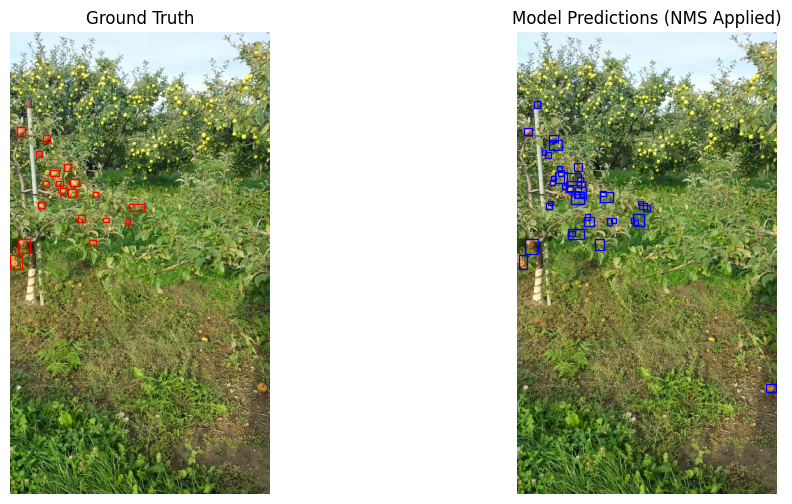

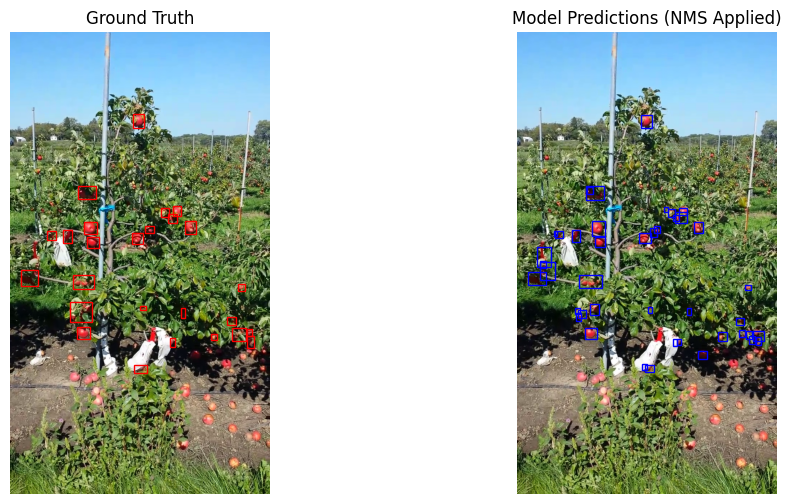

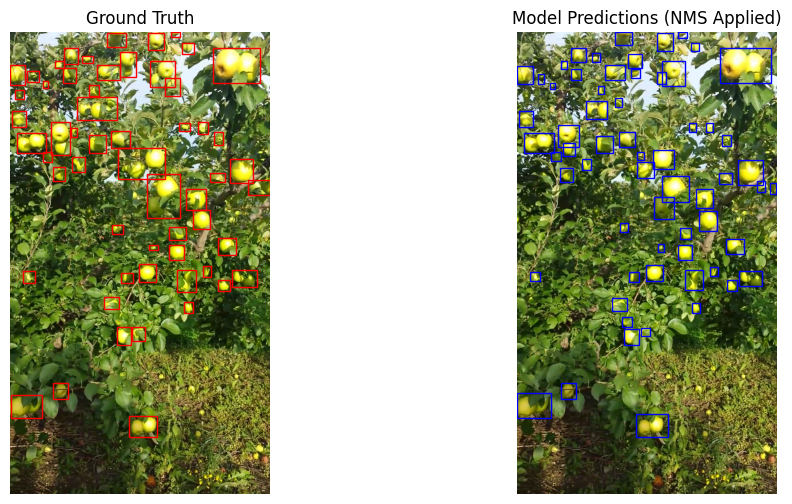

Train Dataset


In [22]:
visualize_predictions(model, train_dataset,num_examples=3)
print("Train Dataset")

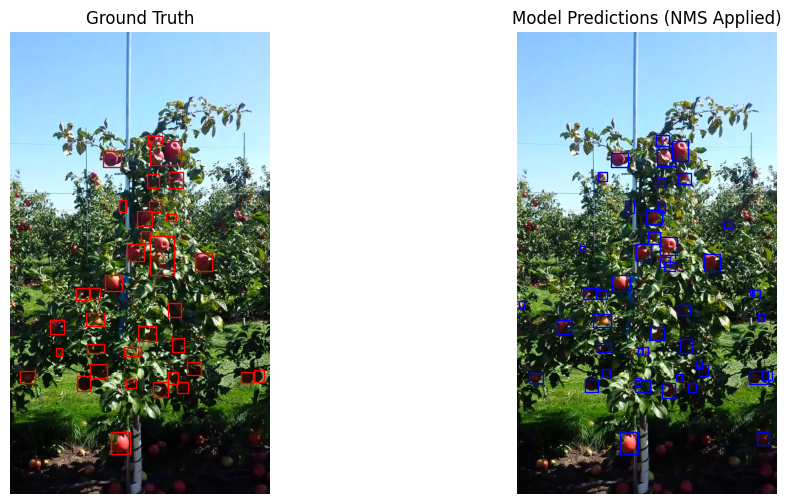

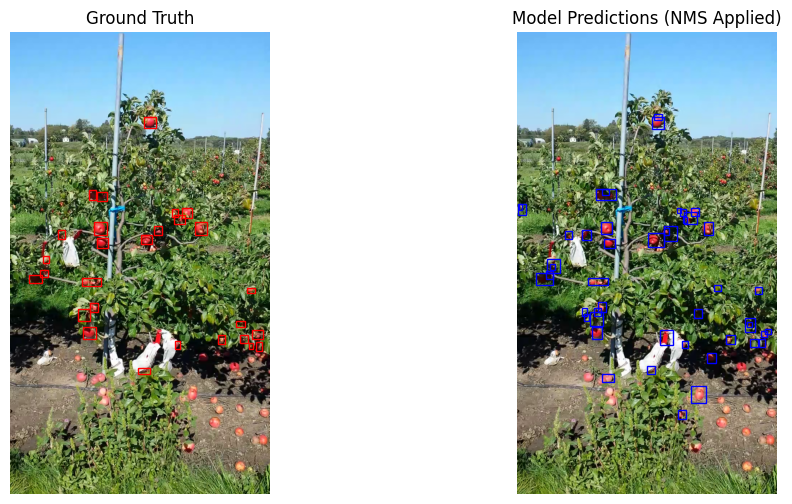

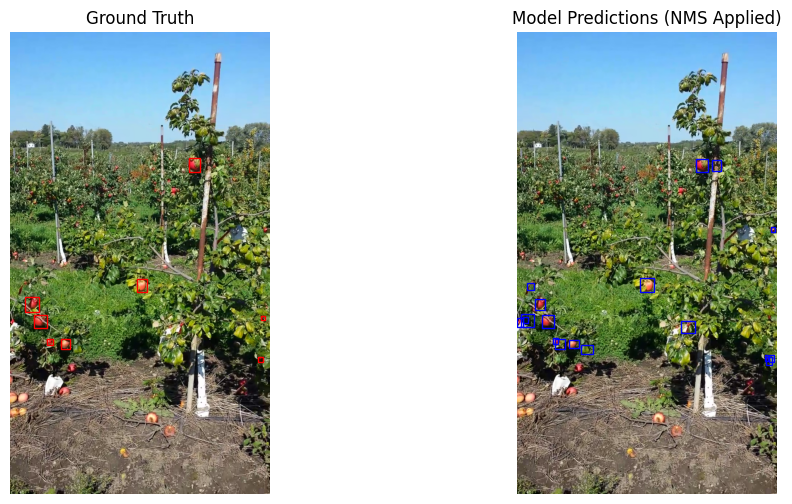

Test Dataset


In [17]:
visualize_predictions(model, test_dataset,num_examples=3)
print("Test Dataset")

## Strategies for Improving Detection – Analysis & Comparison

1. Data Augmentation Techniques
	- Tried: Rotation, Flips, Color Jittering.
	- Observation:
	  - Rotation & Flips caused misalignment between masks and images, leading to incorrect bounding boxes.
	  - Color Jittering (brightness/contrast adjustments) worked well, improving generalization without affecting alignment.

  Conclusion: Rotation & flipping are not suitable for this dataset due to mask misalignment, but brightness/contrast adjustments help.


2. Impact of Image Resolution on Detection Accuracy
  - Higher resolution images help detect small fruits better as feature details are preserved.
  - Downscaled images may lead to missed detections (higher FN count).

  Trade-off: Higher resolution increases computation time but improves accuracy.


In [68]:
# Evaluation Function with Multiple IoU and Score Thresholds
def evaluate_model(model, dataloader, iou_thresholds=[0.3,0.5,0.7], score_thresholds=[0.3,0.5,0.7]):
    model.eval()

    results = {}  # Store results for different IoU and score thresholds

    for score_threshold in score_thresholds:
        for iou_threshold in iou_thresholds:
            all_precisions, all_recalls, all_aps = [], [], []
            total_tp, total_fp, total_fn = 0, 0, 0  # True Positives, False Positives, False Negatives
            all_scores, all_targets = [], []  # Store scores & corresponding ground-truth labels

            with torch.no_grad():
                for images, targets in dataloader:
                    images = [img.to(device) for img in images]
                    outputs = model(images)

                    for output, target in zip(outputs, targets):
                        pred_boxes = output['boxes'].cpu()
                        gt_boxes = target['boxes'].cpu()
                        scores = output['scores'].cpu().numpy()

                        # Filter out low-confidence predictions
                        high_conf_mask = scores > score_threshold
                        pred_boxes = pred_boxes[high_conf_mask]
                        scores = scores[high_conf_mask]

                        if len(pred_boxes) == 0:
                            total_fn += len(gt_boxes)
                            continue

                        # Compute IoU
                        ious = ops.box_iou(pred_boxes, gt_boxes) if len(gt_boxes) > 0 else torch.zeros((len(pred_boxes), 0))

                        max_ious, matched_gt_idx = ious.max(dim=1)  # Best IoU for each predicted box
                        tp_mask = max_ious > iou_threshold  # Predictions that are True Positives
                        tp = tp_mask.sum().item()

                        total_tp += tp
                        total_fp += len(pred_boxes) - tp
                        matched_gt = set(matched_gt_idx[tp_mask].tolist())
                        total_fn += len(gt_boxes) - len(matched_gt)

                        # Assign correct labels (1 for TP, 0 for FP) considering IoU and confidence scores
                        for i, score in enumerate(scores):
                            if max_ious[i] > iou_threshold:  # If prediction matches a GT
                                all_targets.append(1)  # True Positive
                            else:
                                all_targets.append(0)  # False Positive
                            all_scores.append(score)

            # Compute PR Curve and AP using correctly labeled predictions
            precision, recall, _ = precision_recall_curve(all_targets, all_scores)
            mean_ap = average_precision_score(all_targets, all_scores)

            # Store results for this combination of IoU and score thresholds
            results[(iou_threshold, score_threshold)] = {
                "mAP": mean_ap,
                "Total TP": total_tp,
                "Total FP": total_fp,
                "Total FN": total_fn,
                "Precision": precision,
                "Recall": recall
            }

            # Print evaluation metrics for this combination
            print(f"IoU Threshold: {iou_threshold}, Score Threshold: {score_threshold}")
            print(f"mAP: {mean_ap:.4f}")
            print(f"Total TP: {total_tp}, Total FP: {total_fp}, Total FN: {total_fn}\n")

            # Plot Precision-Recall Curve
            plt.figure()
            plt.plot(recall, precision, marker='.')
            plt.xlabel('Recall')
            plt.ylabel('Precision')
            plt.title(f'Precision-Recall Curve (IoU={iou_threshold}, Score={score_threshold}, mAP={mean_ap:.2f})')
            plt.show()



### Role of Non-Maximum Suppression (NMS) in Fruit Detection

- Removes redundant overlapping boxes by keeping the one with the highest confidence score.

- Helps reduce false positives and ensures only the most relevant bounding boxes are retained.

- Prevents the model from detecting the same fruit multiple times with slightly shifted boxes.


IoU Threshold: 0.3, Score Threshold: 0.3
mAP: 0.9192
Total TP: 3186, Total FP: 1033, Total FN: 216



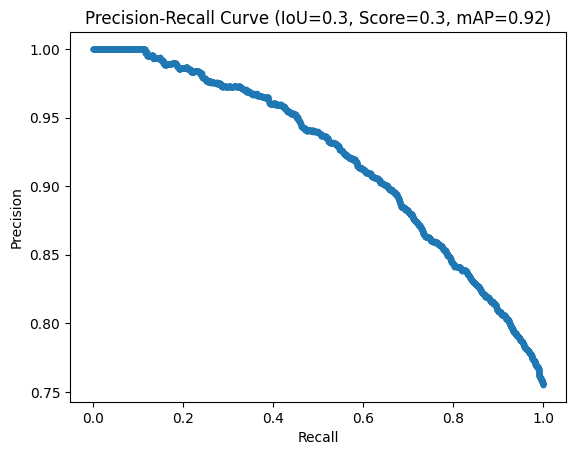

IoU Threshold: 0.5, Score Threshold: 0.3
mAP: 0.8341
Total TP: 1960, Total FP: 2259, Total FN: 416



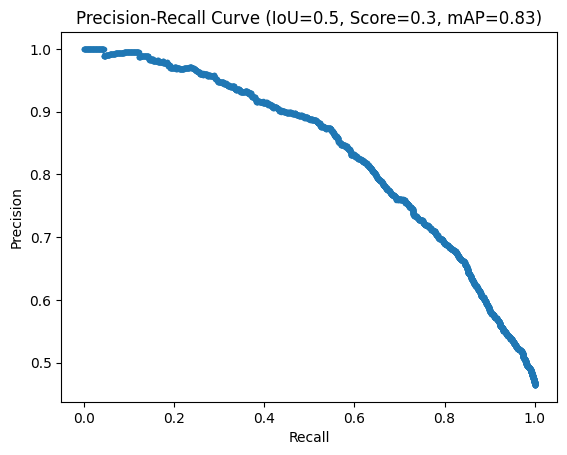

IoU Threshold: 0.7, Score Threshold: 0.3
mAP: 0.7306
Total TP: 946, Total FP: 3273, Total FN: 1100



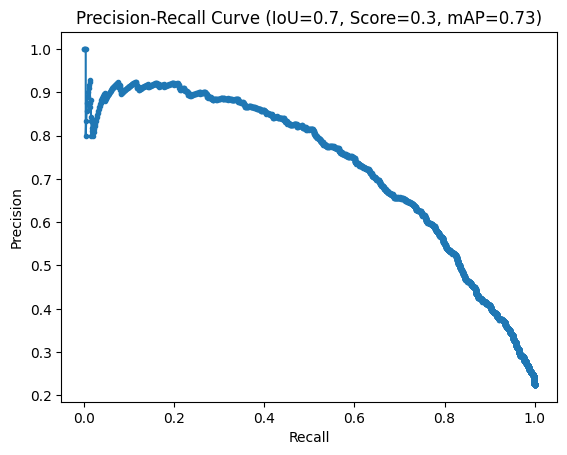

IoU Threshold: 0.3, Score Threshold: 0.5
mAP: 0.9383
Total TP: 2765, Total FP: 602, Total FN: 272



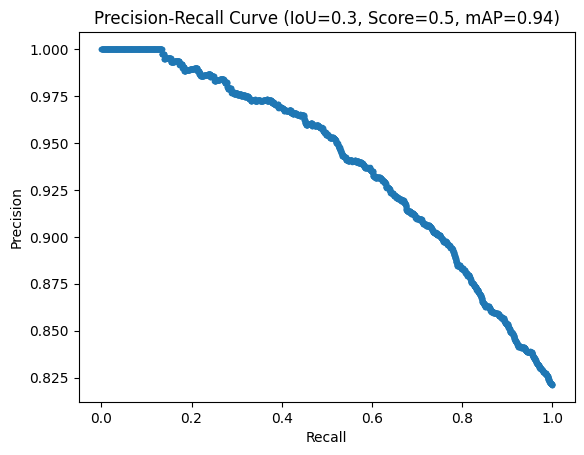

IoU Threshold: 0.5, Score Threshold: 0.5
mAP: 0.8556
Total TP: 1837, Total FP: 1530, Total FN: 486



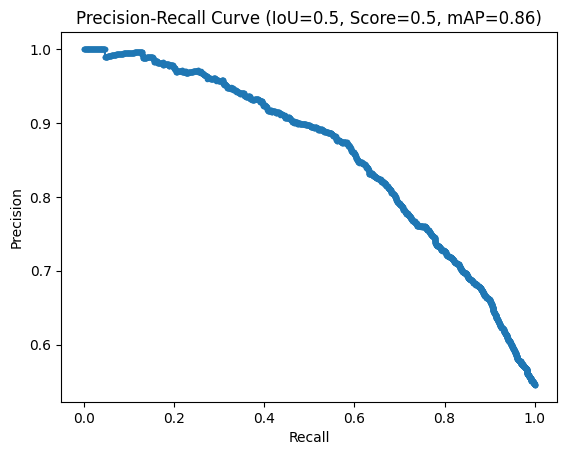

IoU Threshold: 0.7, Score Threshold: 0.5
mAP: 0.7398
Total TP: 928, Total FP: 2439, Total FN: 1118



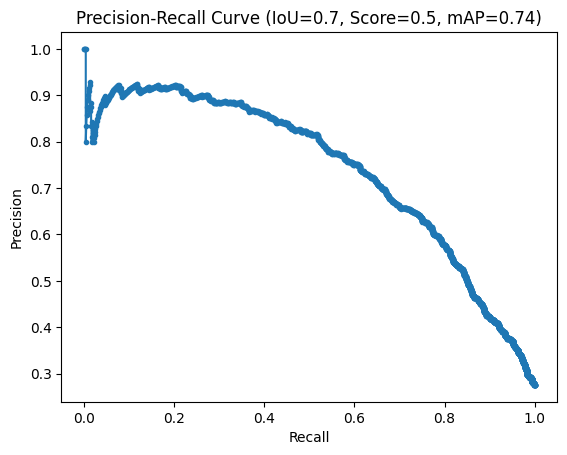

IoU Threshold: 0.3, Score Threshold: 0.7
mAP: 0.9673
Total TP: 1979, Total FP: 203, Total FN: 549



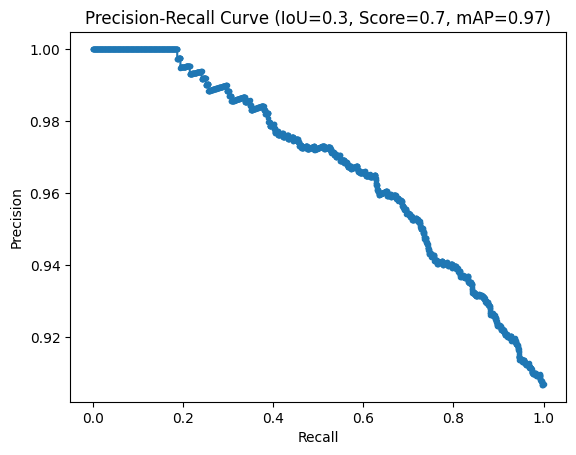

IoU Threshold: 0.5, Score Threshold: 0.7
mAP: 0.8998
Total TP: 1534, Total FP: 648, Total FN: 678



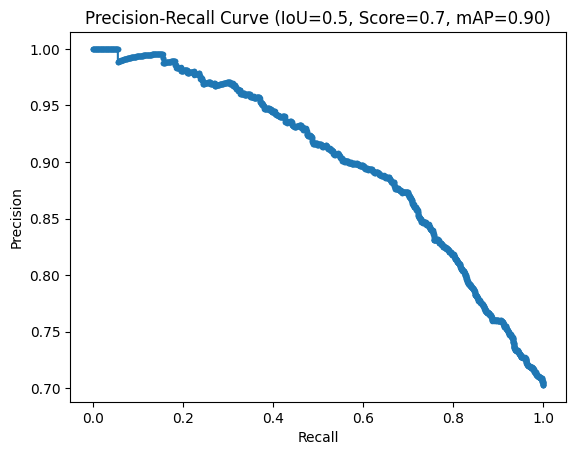

IoU Threshold: 0.7, Score Threshold: 0.7
mAP: 0.7718
Total TP: 859, Total FP: 1323, Total FN: 1187



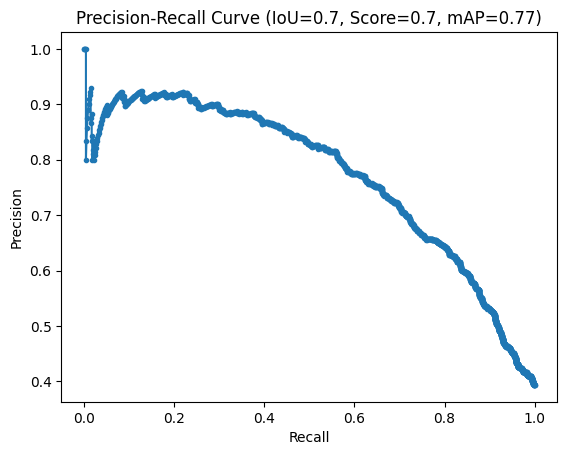

In [69]:
# Run evaluation
evaluate_model(model, test_loader)

### Effect of Different Confidence & IoU Thresholds :
- 	 Increasing the score threshold reduces false positives by filtering low-confidence predictions but may also remove some true positives.
- Increasing the IoU threshold increases the number of false negatives; hence, decreasing it to a reasonable value like 0.3 helps reduce false positives caused by overlapping boxes

- Balancing IoU and score thresholds is key to achieving high precision without sacrificing recall. IoU: 0.3 and Score: 0.5 provide a good balance.


  




In [72]:
def visualize_new_test_images(model, test_images_path, num_examples=3, score_threshold=0.7):
    model.eval()
    test_image_files = sorted(glob.glob(os.path.join(test_images_path, '*.png')) + glob.glob(os.path.join(test_images_path, '*.jpg')))
    test_indices = random.sample(range(len(test_image_files)), min(num_examples, len(test_image_files)))

    for idx in test_indices:
        image = cv2.imread(test_image_files[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        input_tensor = T.ToTensor()(image).to(device)

        with torch.no_grad():
            prediction = model([input_tensor])[0]

        pred_boxes = prediction['boxes']
        scores = prediction['scores']

        # Apply score threshold filter
        high_conf_mask = scores > score_threshold
        pred_boxes = pred_boxes[high_conf_mask]
        scores = scores[high_conf_mask]

        keep = ops.nms(pred_boxes, scores, iou_threshold=0.2)
        pred_boxes = pred_boxes[keep].cpu().numpy()

        fig, ax = plt.subplots(figsize=(6, 6))
        ax.imshow(image)
        for (x1, y1, x2, y2) in pred_boxes:
            ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='blue', fill=False, linewidth=1))
        ax.set_title("Model Predictions on New Test Images")
        ax.axis("off")
        plt.show()

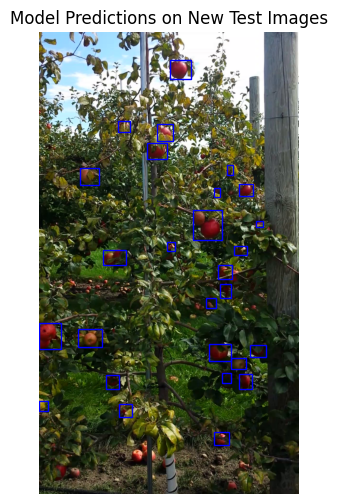

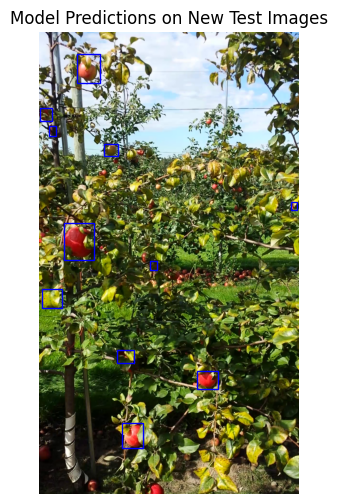

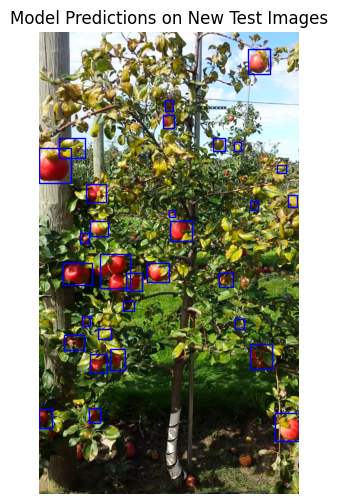

In [73]:
visualize_new_test_images(model, '/content/drive/MyDrive/detection/test/images')

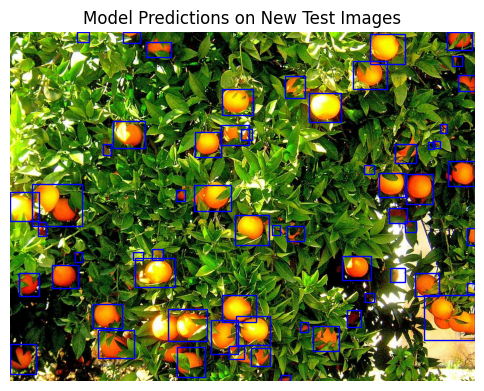

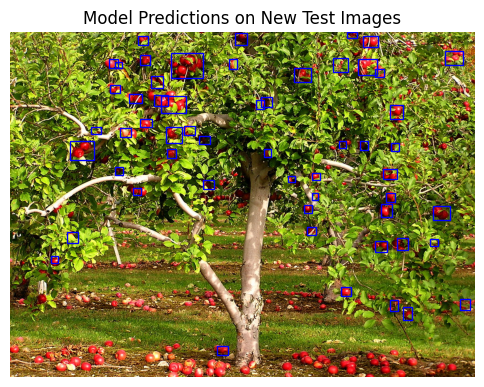

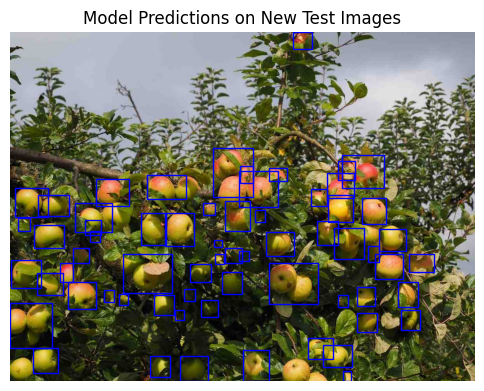

In [36]:
visualize_new_test_images(model, '/content/images')

### Potential Modifications for Improved Detection

#### Adapting the Model to Detect Multiple Fruit Types
- Increase the number of classes in Faster R-CNN to accommodate different fruit categories.  
- Use a diverse dataset with labeled images of multiple fruit types for better generalization.  
- Train with class-aware anchor boxes, adjusting sizes and aspect ratios for different fruit shapes.  

####  Improving Robustness to Environmental Variations
- Apply stronger data augmentation (varying lighting, backgrounds, weather conditions) to improve generalization.  
- Use domain adaptation techniques (fine-tuning on real-world images) to bridge the gap between training and real-world data.  
- Normalize images properly to reduce the effect of illumination changes.  

####  Handling Different Growth Stages and Ripeness Levels
- Incorporate a larger dataset covering different growth stages (unripe, ripe, overripe) to help the model learn variations.  
- Introduce color-based augmentations to simulate ripeness variations (hue and saturation shifts).  
- Train the model with fine-grained classification so it learns to distinguish ripeness levels within the same fruit category.  